In [1]:
import sys
sys.path.append("../")

In [2]:
import os
from cleverhans.attacks import FastGradientMethod
from io import BytesIO
import IPython.display
import numpy as np
import pandas as pd
from PIL import Image
from scipy.misc import imread
from scipy.misc import imsave
import tensorflow as tf
from tensorflow.contrib.slim.nets import inception

In [3]:
slim = tf.contrib.slim
tensorflow_master = ""
checkpoint_path   = "../examples/nips17_adversarial_competition/sample_defenses/adv_inception_v3/adv_inception_v3.ckpt"
input_dir         = "../examples/nips17_adversarial_competition/dataset/images/"

In [4]:
# max_epsilon = 16.0
max_epsilon = 48.0
image_width = 299
image_height = 299
batch_size = 16

In [5]:
eps = 2.0 * max_epsilon / 255.0
batch_shape = [batch_size, image_height, image_width, 3]
num_classes = 1001

In [6]:
def load_images(input_dir, batch_shape):
    images = np.zeros(batch_shape)
    filenames = []
    idx = 0
    batch_size = batch_shape[0]
    for filepath in sorted(tf.gfile.Glob(os.path.join(input_dir, '*.png'))):
        with tf.gfile.Open(filepath, "rb") as f:
            images[idx, :, :, :] = imread(f, mode='RGB').astype(np.float)*2.0/255.0 - 1.0
        filenames.append(os.path.basename(filepath))
        idx += 1
        if idx == batch_size:
            yield filenames, images
            filenames = []
            images = np.zeros(batch_shape)
            idx = 0
    if idx > 0:
        yield filenames, images

def show_image(a, fmt='png'):
    a = np.uint8((a+1.0)/2.0*255.0)
    f = BytesIO()
    Image.fromarray(a).save(f, fmt)
    IPython.display.display(IPython.display.Image(data=f.getvalue()))

class InceptionModel(object):
    def __init__(self, num_classes):
        self.num_classes = num_classes
        self.built = False

    def __call__(self, x_input):
        """Constructs model and return probabilities for given input."""
        reuse = True if self.built else None
        with slim.arg_scope(inception.inception_v3_arg_scope()):
            _, end_points = inception.inception_v3(
                            x_input, num_classes=self.num_classes, is_training=False,
                            reuse=reuse)
        self.built = True
        output = end_points['Predictions']
        probs = output.op.inputs[0]
        return probs

In [7]:
categories = pd.read_csv("./categories.csv")
image_classes = pd.read_csv("./images.csv")
image_iterator = load_images(input_dir, batch_shape)

Here's an example of one of the images in the development set


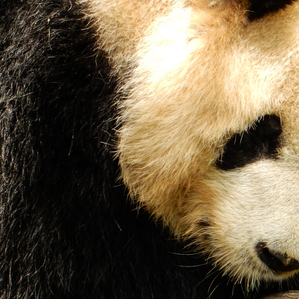

In [8]:
# get first batch of images
filenames, images = next(image_iterator)

image_metadata = pd.DataFrame({"ImageId": [f[:-4] for f in filenames]}).merge(image_classes,
                                                                              on="ImageId")
true_classes = image_metadata["TrueLabel"].tolist()
target_classes = true_labels = image_metadata["TargetClass"].tolist()
true_classes_names = (pd.DataFrame({"CategoryId": true_classes})
                        .merge(categories, how="left", on="CategoryId")["CategoryName"].tolist())
target_classes_names = (pd.DataFrame({"CategoryId": target_classes})
                          .merge(categories, how="left", on="CategoryId")["CategoryName"].tolist())

print("Here's an example of one of the images in the development set")
show_image(images[0])

In [9]:
true_classes

[389, 577, 327, 138, 91, 982, 10, 472, 304, 968, 451, 327, 580, 975, 625, 18]

In [10]:
target_classes_names

['meat loaf, meatloaf',
 'wing',
 'cocker spaniel, English cocker spaniel, cocker',
 'jacamar',
 'fountain',
 'Arabian camel, dromedary, Camelus dromedarius',
 'vault',
 'drilling platform, offshore rig',
 'espresso maker',
 'nail',
 'strainer',
 'bakery, bakeshop, bakehouse',
 'mailbox, letter box',
 'pug, pug-dog',
 'safety pin',
 'echidna, spiny anteater, anteater']

../cleverhans/attacks.py:36: UserWarning: CleverHans support for supplying a callable instead of an instance of the cleverhans.model.Model class is deprecated and will be dropped on 2018-01-11.
  warnings.warn("CleverHans support for supplying a callable"


INFO:tensorflow:Restoring parameters from ../examples/nips17_adversarial_competition/sample_defenses/adv_inception_v3/adv_inception_v3.ckpt
The original image is on the left, and the nontargeted adversarial image is on the right. They look very similar, don't they? It's very clear both are gondolas


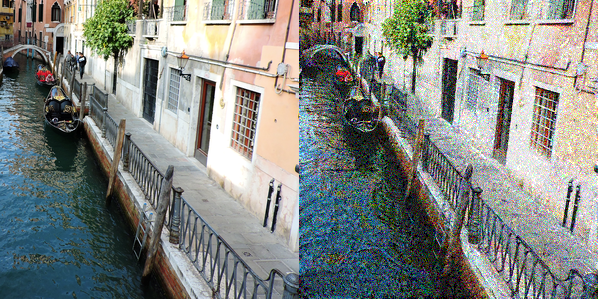

In [11]:
tf.logging.set_verbosity(tf.logging.INFO)

with tf.Graph().as_default():
    x_input = tf.placeholder(tf.float32, shape=batch_shape)
    model = InceptionModel(num_classes)

    fgsm  = FastGradientMethod(model)
    x_adv = fgsm.generate(x_input, eps=eps, clip_min=-1., clip_max=1.)

    saver = tf.train.Saver(slim.get_model_variables())
    session_creator = tf.train.ChiefSessionCreator(
                      scaffold=tf.train.Scaffold(saver=saver),
                      checkpoint_filename_with_path=checkpoint_path,
                      master=tensorflow_master)

    with tf.train.MonitoredSession(session_creator=session_creator) as sess:
        nontargeted_images = sess.run(x_adv, feed_dict={x_input: images})

print("The original image is on the left, and the nontargeted adversarial image is on the right. They look very similar, don't they? It's very clear both are gondolas")
show_image(np.concatenate([images[1], nontargeted_images[1]], axis=1))

INFO:tensorflow:Restoring parameters from ../examples/nips17_adversarial_competition/sample_defenses/adv_inception_v3/adv_inception_v3.ckpt
The original image is on the left, and the targeted adversarial image is on the right. Again, they look very similar, don't they? It's very clear both are butterflies


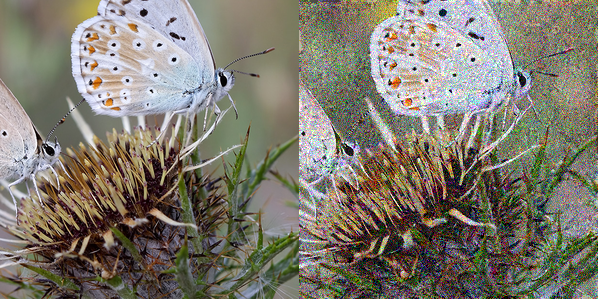

In [12]:
all_images_target_class = {image_metadata["ImageId"][i]+".png": image_metadata["TargetClass"][i]
                           for i in image_metadata.index}

with tf.Graph().as_default():
    x_input = tf.placeholder(tf.float32, shape=batch_shape)

    with slim.arg_scope(inception.inception_v3_arg_scope()):
        logits, end_points = inception.inception_v3(
            x_input, num_classes=num_classes, is_training=False)

    target_class_input = tf.placeholder(tf.int32, shape=[batch_size])
    one_hot_target_class = tf.one_hot(target_class_input, num_classes)
    cross_entropy = tf.losses.softmax_cross_entropy(one_hot_target_class,
                                                    logits,
                                                    label_smoothing=0.1,
                                                    weights=1.0)
    cross_entropy += tf.losses.softmax_cross_entropy(one_hot_target_class,
                                                     end_points['AuxLogits'],
                                                     label_smoothing=0.1,
                                                     weights=0.4)
    x_adv = x_input - eps * tf.sign(tf.gradients(cross_entropy, x_input)[0])
    x_adv = tf.clip_by_value(x_adv, -1.0, 1.0)

    saver = tf.train.Saver(slim.get_model_variables())
    session_creator = tf.train.ChiefSessionCreator(
        scaffold=tf.train.Scaffold(saver=saver),
        checkpoint_filename_with_path=checkpoint_path,
        master=tensorflow_master)

    with tf.train.MonitoredSession(session_creator=session_creator) as sess:
        target_class_for_batch = ([all_images_target_class[n] for n in filenames]
                                  + [0] * (batch_size - len(filenames)))
        targeted_images = sess.run(x_adv,
                                   feed_dict={x_input: images,
                                              target_class_input: target_class_for_batch})
        
print("The original image is on the left, and the targeted adversarial image is on the right. Again, they look very similar, don't they? It's very clear both are butterflies")
show_image(np.concatenate([images[2], targeted_images[2]], axis=1))

In [13]:
with tf.Graph().as_default():
    x_input = tf.placeholder(tf.float32, shape=batch_shape)

    with slim.arg_scope(inception.inception_v3_arg_scope()):
        _, end_points = inception.inception_v3(x_input, num_classes=num_classes, is_training=False)
    
    predicted_labels = tf.argmax(end_points['Predictions'], 1)

    saver = tf.train.Saver(slim.get_model_variables())
    session_creator = tf.train.ChiefSessionCreator(
                      scaffold=tf.train.Scaffold(saver=saver),
                      checkpoint_filename_with_path=checkpoint_path,
                      master=tensorflow_master)

    with tf.train.MonitoredSession(session_creator=session_creator) as sess:
        predicted_classes = sess.run(predicted_labels, feed_dict={x_input: images})
        predicted_nontargeted_classes = sess.run(predicted_labels, feed_dict={x_input: nontargeted_images})
        predicted_targeted_classes = sess.run(predicted_labels, feed_dict={x_input: targeted_images})

predicted_classes_names = (pd.DataFrame({"CategoryId": predicted_classes})
                           .merge(categories, on="CategoryId")["CategoryName"].tolist())

predicted_nontargeted_classes_names = (pd.DataFrame({"CategoryId": predicted_nontargeted_classes})
                          .merge(categories, on="CategoryId")["CategoryName"].tolist())

predicted_targeted_classes_names = (pd.DataFrame({"CategoryId": predicted_targeted_classes})
                          .merge(categories, on="CategoryId")["CategoryName"].tolist())

INFO:tensorflow:Restoring parameters from ../examples/nips17_adversarial_competition/sample_defenses/adv_inception_v3/adv_inception_v3.ckpt


In [14]:
import time

UNMODIFIED IMAGE (left) 
	Predicted class: giant panda, panda, panda bear, coon bear, Ailuropoda melanoleuca 
	True class:      giant panda, panda, panda bear, coon bear, Ailuropoda melanoleuca
NONTARGETED ADVERSARIAL IMAGE (center) 
	Predicted class: giant panda, panda, panda bear, coon bear, Ailuropoda melanoleuca
TARGETED ADVERSARIAL IMAGE (right) 
	Predicted class: giant panda, panda, panda bear, coon bear, Ailuropoda melanoleuca 
	Target class:    meat loaf, meatloaf


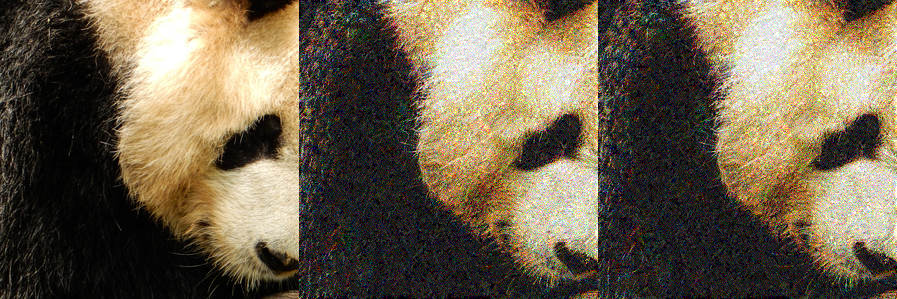

UNMODIFIED IMAGE (left) 
	Predicted class: gondola 
	True class:      gondola
NONTARGETED ADVERSARIAL IMAGE (center) 
	Predicted class: gondola
TARGETED ADVERSARIAL IMAGE (right) 
	Predicted class: gondola 
	Target class:    wing


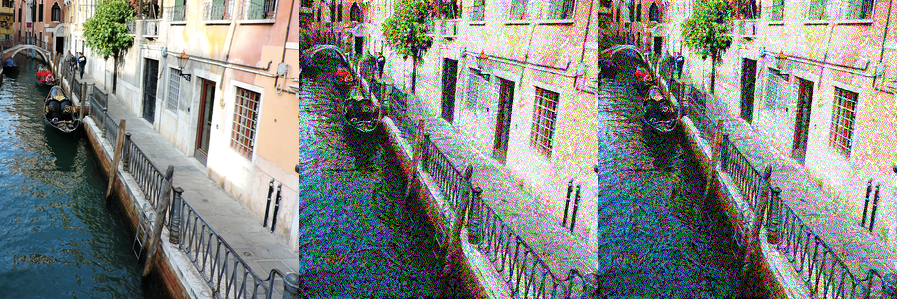

UNMODIFIED IMAGE (left) 
	Predicted class: lycaenid, lycaenid butterfly 
	True class:      lycaenid, lycaenid butterfly
NONTARGETED ADVERSARIAL IMAGE (center) 
	Predicted class: sea urchin
TARGETED ADVERSARIAL IMAGE (right) 
	Predicted class: sea urchin 
	Target class:    cocker spaniel, English cocker spaniel, cocker


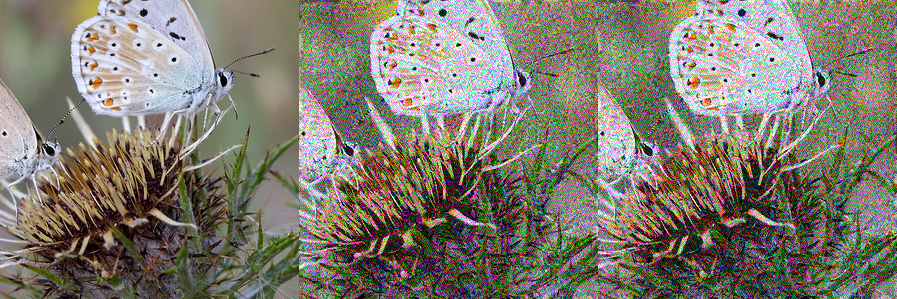

UNMODIFIED IMAGE (left) 
	Predicted class: lycaenid, lycaenid butterfly 
	True class:      American coot, marsh hen, mud hen, water hen, Fulica americana
NONTARGETED ADVERSARIAL IMAGE (center) 
	Predicted class: killer whale, killer, orca, grampus, sea wolf, Orcinus orca
TARGETED ADVERSARIAL IMAGE (right) 
	Predicted class: killer whale, killer, orca, grampus, sea wolf, Orcinus orca 
	Target class:    jacamar


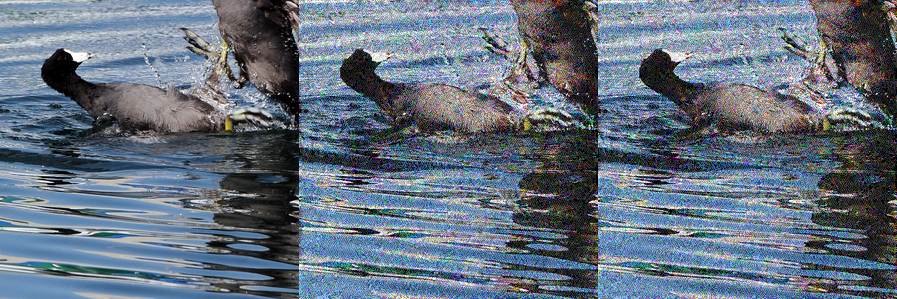

UNMODIFIED IMAGE (left) 
	Predicted class: American coot, marsh hen, mud hen, water hen, Fulica americana 
	True class:      lorikeet
NONTARGETED ADVERSARIAL IMAGE (center) 
	Predicted class: lorikeet
TARGETED ADVERSARIAL IMAGE (right) 
	Predicted class: lorikeet 
	Target class:    fountain


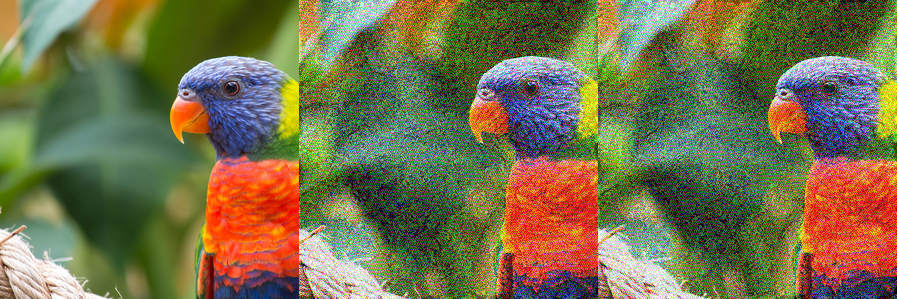

UNMODIFIED IMAGE (left) 
	Predicted class: lorikeet 
	True class:      ballplayer, baseball player
NONTARGETED ADVERSARIAL IMAGE (center) 
	Predicted class: ballplayer, baseball player
TARGETED ADVERSARIAL IMAGE (right) 
	Predicted class: ballplayer, baseball player 
	Target class:    Arabian camel, dromedary, Camelus dromedarius


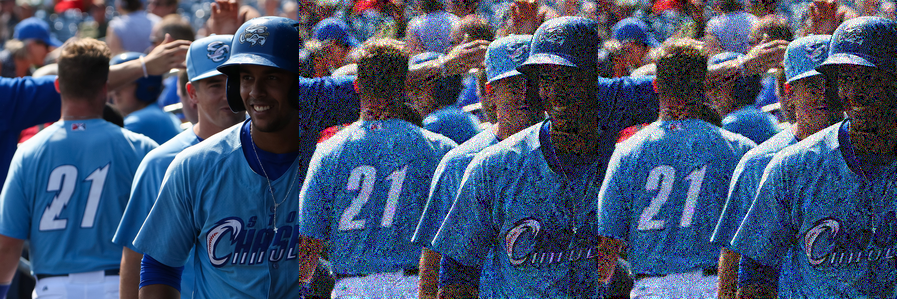

UNMODIFIED IMAGE (left) 
	Predicted class: ballplayer, baseball player 
	True class:      ostrich, Struthio camelus
NONTARGETED ADVERSARIAL IMAGE (center) 
	Predicted class: ostrich, Struthio camelus
TARGETED ADVERSARIAL IMAGE (right) 
	Predicted class: ostrich, Struthio camelus 
	Target class:    vault


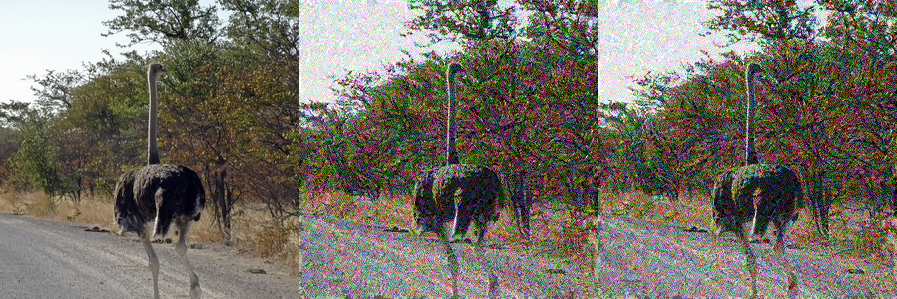

UNMODIFIED IMAGE (left) 
	Predicted class: ostrich, Struthio camelus 
	True class:      cannon
NONTARGETED ADVERSARIAL IMAGE (center) 
	Predicted class: tricycle, trike, velocipede
TARGETED ADVERSARIAL IMAGE (right) 
	Predicted class: unicycle, monocycle 
	Target class:    drilling platform, offshore rig


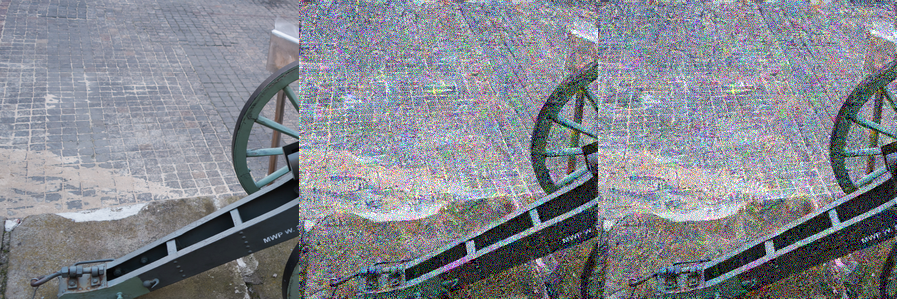

UNMODIFIED IMAGE (left) 
	Predicted class: cannon 
	True class:      long-horned beetle, longicorn, longicorn beetle
NONTARGETED ADVERSARIAL IMAGE (center) 
	Predicted class: long-horned beetle, longicorn, longicorn beetle
TARGETED ADVERSARIAL IMAGE (right) 
	Predicted class: ground beetle, carabid beetle 
	Target class:    espresso maker


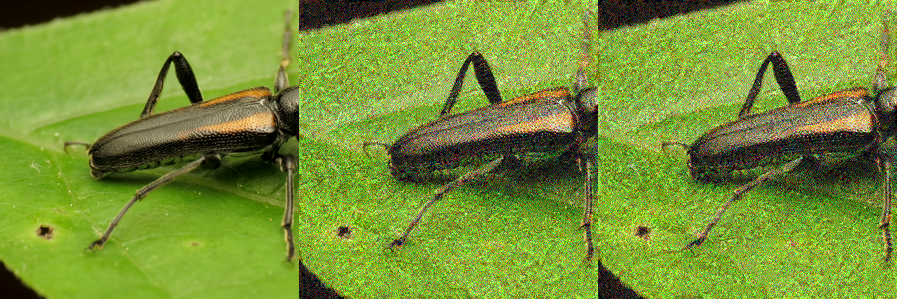

UNMODIFIED IMAGE (left) 
	Predicted class: long-horned beetle, longicorn, longicorn beetle 
	True class:      espresso
NONTARGETED ADVERSARIAL IMAGE (center) 
	Predicted class: espresso
TARGETED ADVERSARIAL IMAGE (right) 
	Predicted class: espresso 
	Target class:    nail


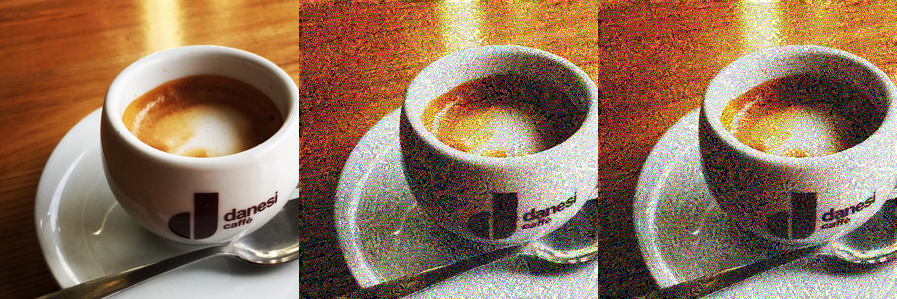

UNMODIFIED IMAGE (left) 
	Predicted class: espresso 
	True class:      bobsled, bobsleigh, bob
NONTARGETED ADVERSARIAL IMAGE (center) 
	Predicted class: bobsled, bobsleigh, bob
TARGETED ADVERSARIAL IMAGE (right) 
	Predicted class: bobsled, bobsleigh, bob 
	Target class:    strainer


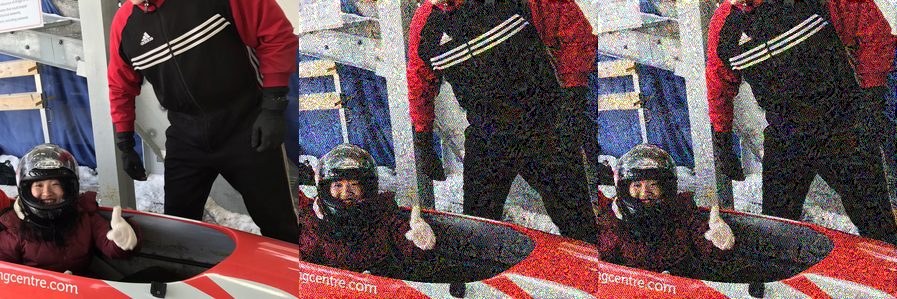

UNMODIFIED IMAGE (left) 
	Predicted class: bobsled, bobsleigh, bob 
	True class:      lycaenid, lycaenid butterfly
NONTARGETED ADVERSARIAL IMAGE (center) 
	Predicted class: pick, plectrum, plectron
TARGETED ADVERSARIAL IMAGE (right) 
	Predicted class: stethoscope 
	Target class:    bakery, bakeshop, bakehouse


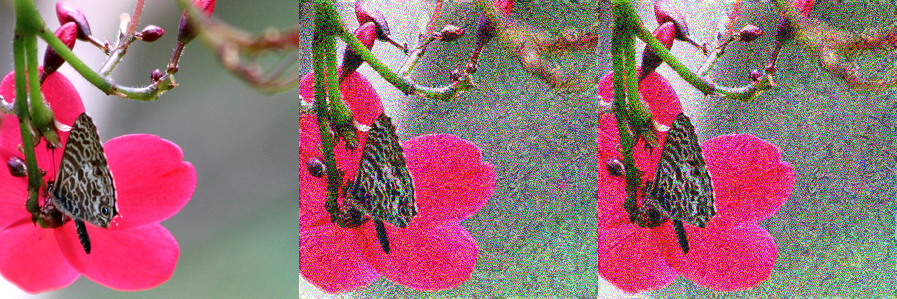

UNMODIFIED IMAGE (left) 
	Predicted class: grand piano, grand 
	True class:      grand piano, grand
NONTARGETED ADVERSARIAL IMAGE (center) 
	Predicted class: grand piano, grand
TARGETED ADVERSARIAL IMAGE (right) 
	Predicted class: grand piano, grand 
	Target class:    mailbox, letter box


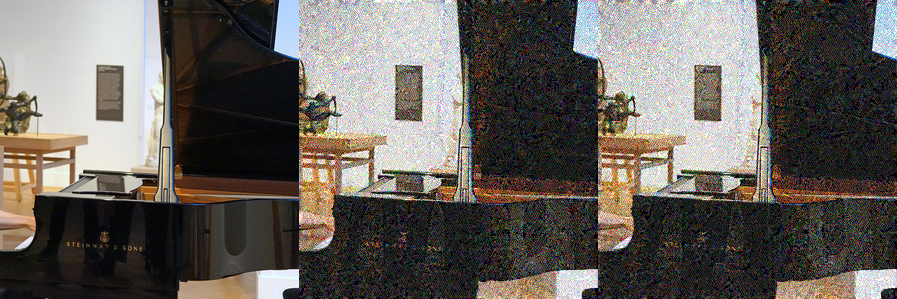

UNMODIFIED IMAGE (left) 
	Predicted class: geyser 
	True class:      geyser
NONTARGETED ADVERSARIAL IMAGE (center) 
	Predicted class: sandbar, sand bar
TARGETED ADVERSARIAL IMAGE (right) 
	Predicted class: sandbar, sand bar 
	Target class:    pug, pug-dog


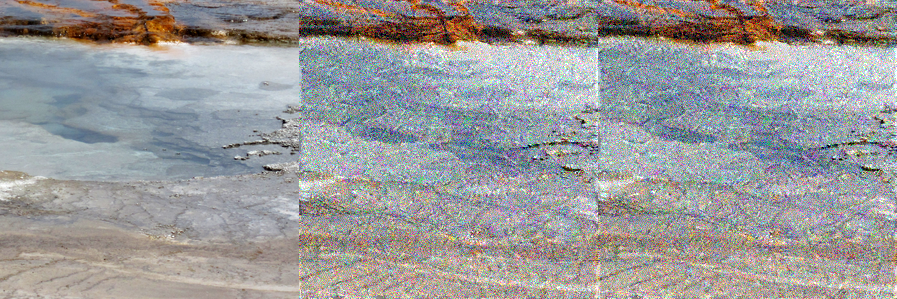

UNMODIFIED IMAGE (left) 
	Predicted class: library 
	True class:      library
NONTARGETED ADVERSARIAL IMAGE (center) 
	Predicted class: library
TARGETED ADVERSARIAL IMAGE (right) 
	Predicted class: library 
	Target class:    safety pin


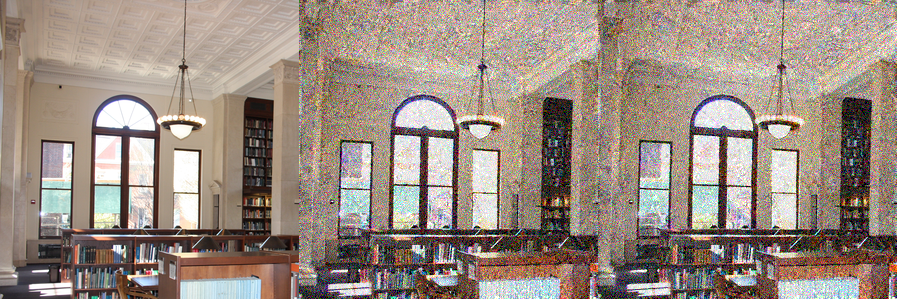

UNMODIFIED IMAGE (left) 
	Predicted class: jay 
	True class:      jay
NONTARGETED ADVERSARIAL IMAGE (center) 
	Predicted class: jay
TARGETED ADVERSARIAL IMAGE (right) 
	Predicted class: jay 
	Target class:    echidna, spiny anteater, anteater


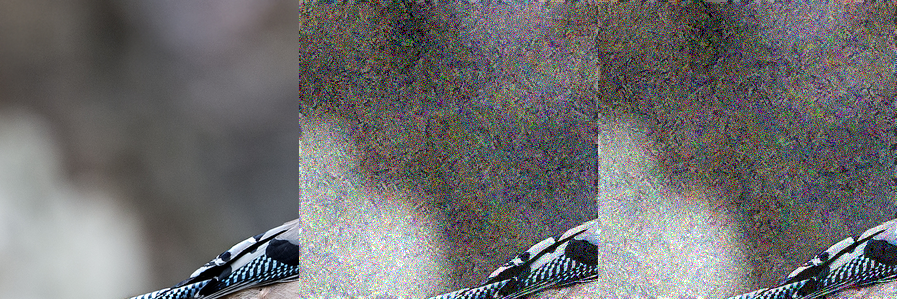

In [15]:
for i in range(len(images)):
    print("UNMODIFIED IMAGE (left)",
          "\n\tPredicted class:", predicted_classes_names[i],
          "\n\tTrue class:     ", true_classes_names[i])
    print("NONTARGETED ADVERSARIAL IMAGE (center)",
          "\n\tPredicted class:", predicted_nontargeted_classes_names[i])
    print("TARGETED ADVERSARIAL IMAGE (right)",
          "\n\tPredicted class:", predicted_targeted_classes_names[i],
          "\n\tTarget class:   ", target_classes_names[i])
    show_image(np.concatenate([images[i], nontargeted_images[i], targeted_images[i]], axis=1))
    time.sleep(1)